# Running STAGE with HEST profiles

This project focuses on running the STAGE machine learning model using HEST spatial transcriptomics profiles captured with Visium technology from the Kidney and Lung.

## Dependencies

In [1]:
from hest import iter_hest
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
import STAGE
import scanpy as sc
import matplotlib.pyplot as plt
import anndata
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from scipy.stats import pearsonr
from tqdm import tqdm
import joblib

## Data Preprocessing

Get the profile IDs taken with Visium from the Kidney and Lung.

In [2]:
# get the metadata dataframe
meta_df = pd.read_csv('ocamargo/HEST/assets/HEST_v1_1_0.csv')

# filter the profiles
visium_lung_kidney_id_list = meta_df[(meta_df['st_technology'] == 'Visium') & 
                  (meta_df['organ'].isin(['Kidney', 'Lung']))]['id'].tolist()

print(visium_lung_kidney_id_list)

['TENX72', 'TENX71', 'TENX62', 'TENX45', 'TENX22', 'INT24', 'INT23', 'INT22', 'INT21', 'INT20', 'INT19', 'INT18', 'INT17', 'INT16', 'INT15', 'INT14', 'INT13', 'INT12', 'INT11', 'INT10', 'INT9', 'INT8', 'INT7', 'INT6', 'INT5', 'INT4', 'INT3', 'INT2', 'INT1', 'MEND90', 'MEND89', 'MEND88', 'MEND87', 'MEND86', 'MEND85', 'MEND54', 'MEND52', 'MEND51', 'MEND49', 'MEND48', 'MEND47', 'MEND45', 'MEND41', 'NCBI727', 'NCBI714', 'NCBI713', 'NCBI712', 'NCBI711', 'NCBI710', 'NCBI709', 'NCBI708', 'NCBI707', 'NCBI706', 'NCBI705', 'NCBI704', 'NCBI703', 'NCBI702', 'NCBI701', 'NCBI700', 'NCBI699', 'NCBI698', 'NCBI697', 'NCBI696', 'NCBI695', 'NCBI694', 'NCBI693', 'NCBI692', 'NCBI599', 'NCBI598', 'NCBI597', 'NCBI596', 'NCBI568', 'NCBI567', 'NCBI566', 'NCBI565', 'NCBI564', 'NCBI563', 'NCBI562', 'NCBI540', 'NCBI539', 'NCBI538', 'NCBI537', 'NCBI536', 'NCBI535', 'NCBI534', 'MISC32', 'MISC31', 'MISC30', 'MISC29', 'MISC28', 'MISC27', 'MISC26', 'MISC25', 'MISC24', 'MISC23', 'MISC22', 'MISC21', 'MISC20', 'MISC19', 

In [3]:
id = [visium_lung_kidney_id_list[1]]

# create adata variable
adata = None

# save visium anndata
for st in iter_hest('ocamargo/hest_data', id_list=id):
    # define adata with the profile anndata
    adata = st.adata
    
adata.var_names_make_unique()

In [4]:
# Coordinates (array_col, array_row)
adata.obsm["coord"]=adata.obs.loc[:, ['array_col', 'array_row']].to_numpy()

## Recovery Experiment

In [5]:
# Normalization
sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=3000)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

### Training

In [6]:
adata_sample, adata_stage = STAGE.STAGE(
    adata,
    save_path='./STAGE_RESULT',
    data_type='10x',
    experiment='recovery',
    down_ratio=0.5,
    coord_sf=77,
    train_epoch=500,
    seed=1234,
    batch_size=512,
    learning_rate=1e-3,
    w_recon=0.1,
    w_w=0.1,
    w_l1=0.1,
    relu=True,
    device='cuda:0',
    path1='./STAGE_RESULT/file_tmp',
)

Epochs: 100%|██████████| 500/500 [04:56<00:00,  1.69it/s, latent_loss: 0.02005, recon_loss: 0.17009, total_loss: 0.00371]


adata_stage

### Data Visualization

In [7]:
# Flip the y-coordinates
adata.obsm['coord'][:,1] = adata.obsm['coord'][:,1]*(-1)

In [8]:
# Select marker genes
show_gene=['MXRA8', 'CLCNKA', 'SFN', 'FCN3', 'LAPTM5', 'FAM151A', 'TACSTD2', 'JUN',
       'PTGER3', 'ST6GALNAC3']

#### Original Data

[<Axes: title={'center': 'MXRA8'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'CLCNKA'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'SFN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FCN3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'LAPTM5'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FAM151A'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'TACSTD2'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'JUN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'PTGER3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'ST6GALNAC3'}, xlabel='coord1', ylabel='coord2'>]

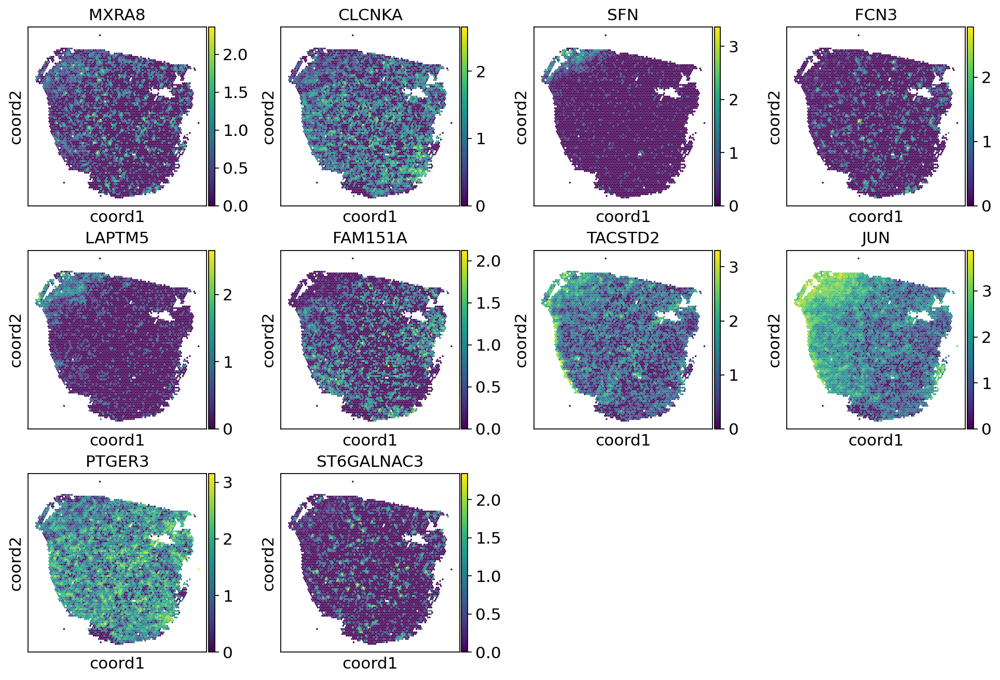

In [9]:
sc.set_figure_params(dpi=80, figsize=(2.8, 3))
sc.pl.embedding(adata, basis="coord", color=show_gene, s=10, show=False)

#### Downsampled Data

[<Axes: title={'center': 'MXRA8'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'CLCNKA'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'SFN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FCN3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'LAPTM5'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FAM151A'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'TACSTD2'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'JUN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'PTGER3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'ST6GALNAC3'}, xlabel='coord1', ylabel='coord2'>]

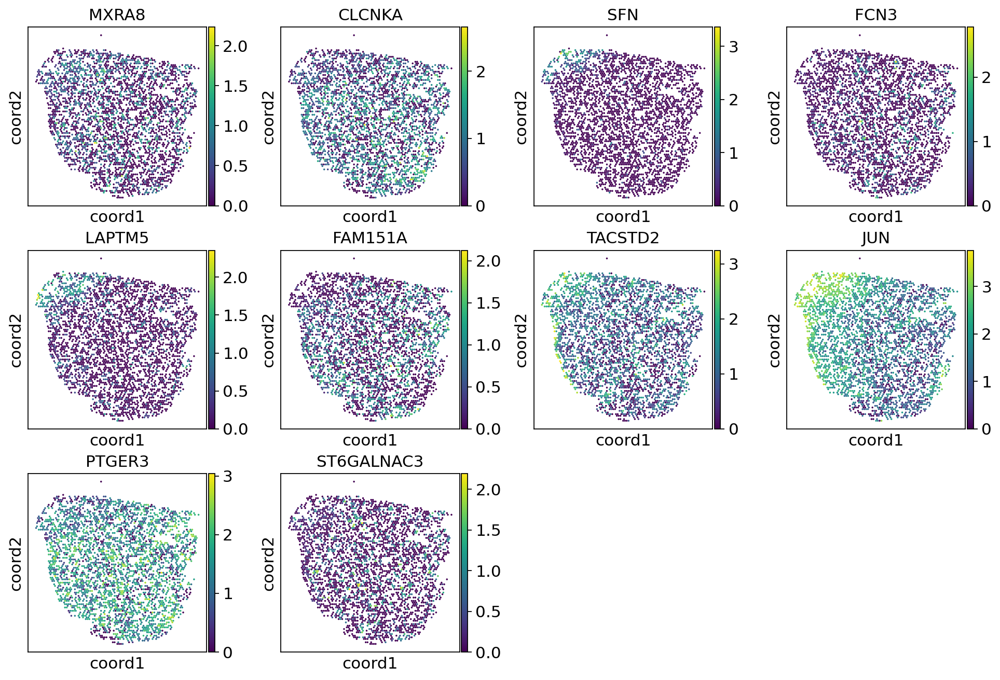

In [10]:
sc.set_figure_params(dpi=80, figsize=(2.8, 3))
sc.pl.embedding(adata_sample, basis="coord", color=show_gene, s=10, show=False)

#### Recovered Data (train_epoch=500)

[<Axes: title={'center': 'MXRA8'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'CLCNKA'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'SFN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FCN3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'LAPTM5'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FAM151A'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'TACSTD2'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'JUN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'PTGER3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'ST6GALNAC3'}, xlabel='coord1', ylabel='coord2'>]

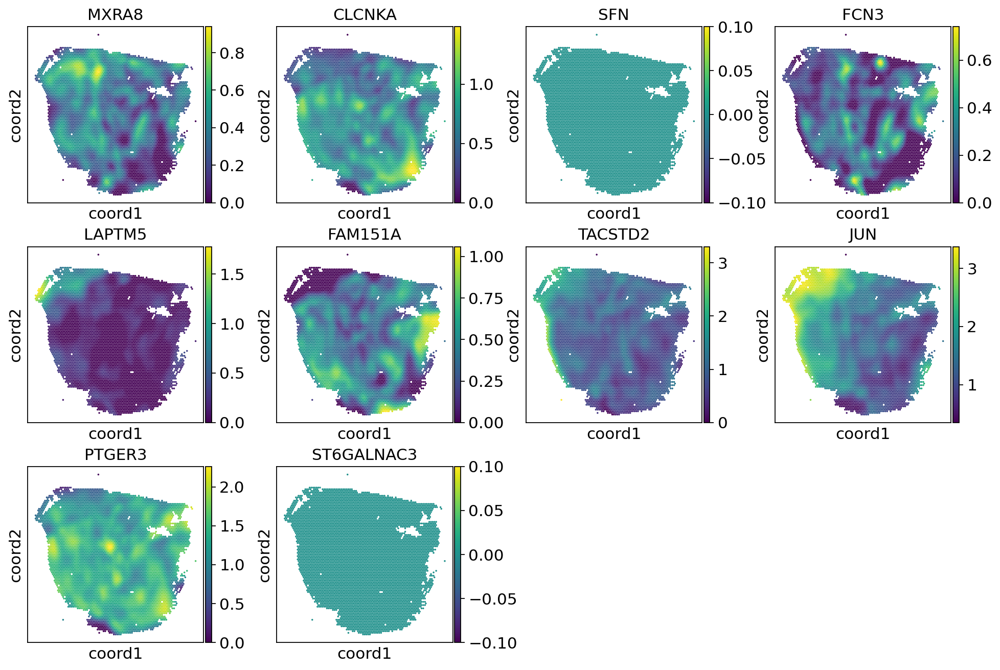

In [11]:
sc.set_figure_params(dpi=80, figsize=(2.8, 3))
sc.pl.embedding(adata_stage, basis="coord", color=show_gene, s=10, show=False)

In [12]:
print(np.all(adata_stage.obsm['coord'] == adata.obsm['coord']))

True


The coordinates of the original and recovered data are the same.

#### Recovered data (train_epoch=10,000)

In [13]:
adata_stage_10000 = joblib.load("adata_stage.joblib")

[<Axes: title={'center': 'MXRA8'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'CLCNKA'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'SFN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FCN3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'LAPTM5'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FAM151A'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'TACSTD2'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'JUN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'PTGER3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'ST6GALNAC3'}, xlabel='coord1', ylabel='coord2'>]

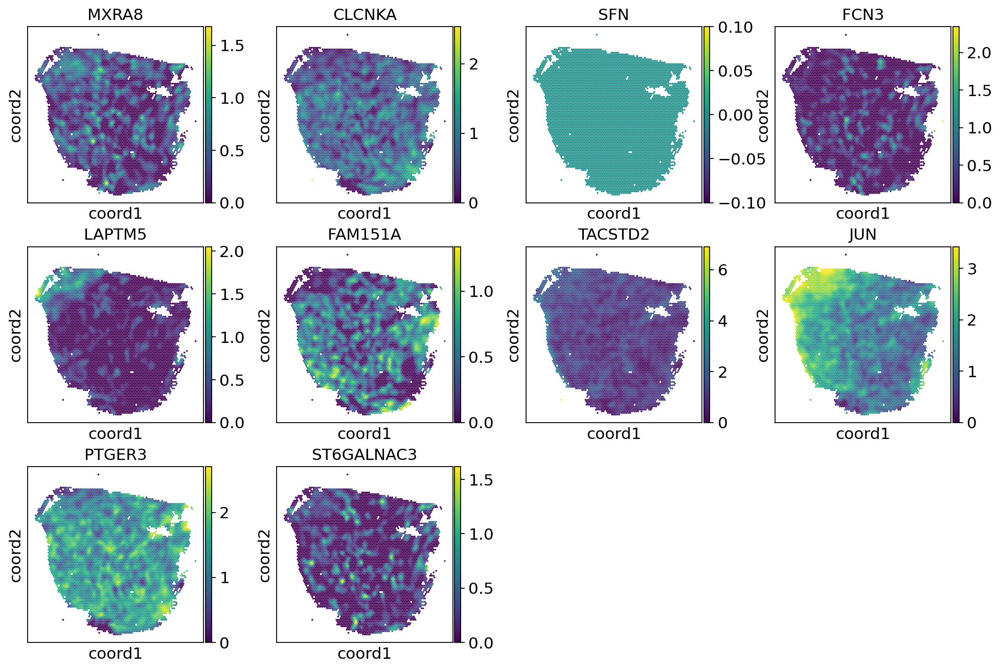

In [14]:
sc.set_figure_params(dpi=80, figsize=(2.8, 3))
sc.pl.embedding(adata_stage_10000, basis="coord", color=show_gene, s=10, show=False)

#### Verifying Downsampling

In [15]:
type(adata)

anndata._core.anndata.AnnData

In [16]:
type(adata_stage)

anndata._core.anndata.AnnData

In [17]:
type(adata_sample)

anndata._core.anndata.AnnData

In [18]:
adata_sample_10000 = joblib.load("adata_sample.joblib")

In [19]:
adata_sample_stored = sc.read_h5ad('STAGE_RESULT/sampled_data.h5ad')
adata_sample_stored.obsm['coord'][:,1] = adata_sample_stored.obsm['coord'][:,1]*(-1)

In [20]:
print(np.all(adata_sample.obsm['coord'] == adata_sample_stored.obsm['coord']))

True


In [21]:
print(adata_sample_10000.obsm['coord'])

[[ 36 -54]
 [162 -98]
 [ 43 -31]
 ...
 [ 82 -40]
 [131 -37]
 [110 -86]]


In [22]:
print(adata_sample.obsm['coord'])

[[ 32 -54]
 [158 -98]
 [ 39 -31]
 ...
 [ 78 -40]
 [127 -37]
 [106 -86]]


In [23]:
print(adata_sample_stored.obsm['coord'])

[[ 32 -54]
 [158 -98]
 [ 39 -31]
 ...
 [ 78 -40]
 [127 -37]
 [106 -86]]


In [24]:
print(adata.obsm['coord'])

[[ 32 -54]
 [158 -98]
 [ 39 -31]
 ...
 [127 -37]
 [ 87 -83]
 [106 -86]]


<Axes: title={'center': 'MXRA8'}, xlabel='coord1', ylabel='coord2'>

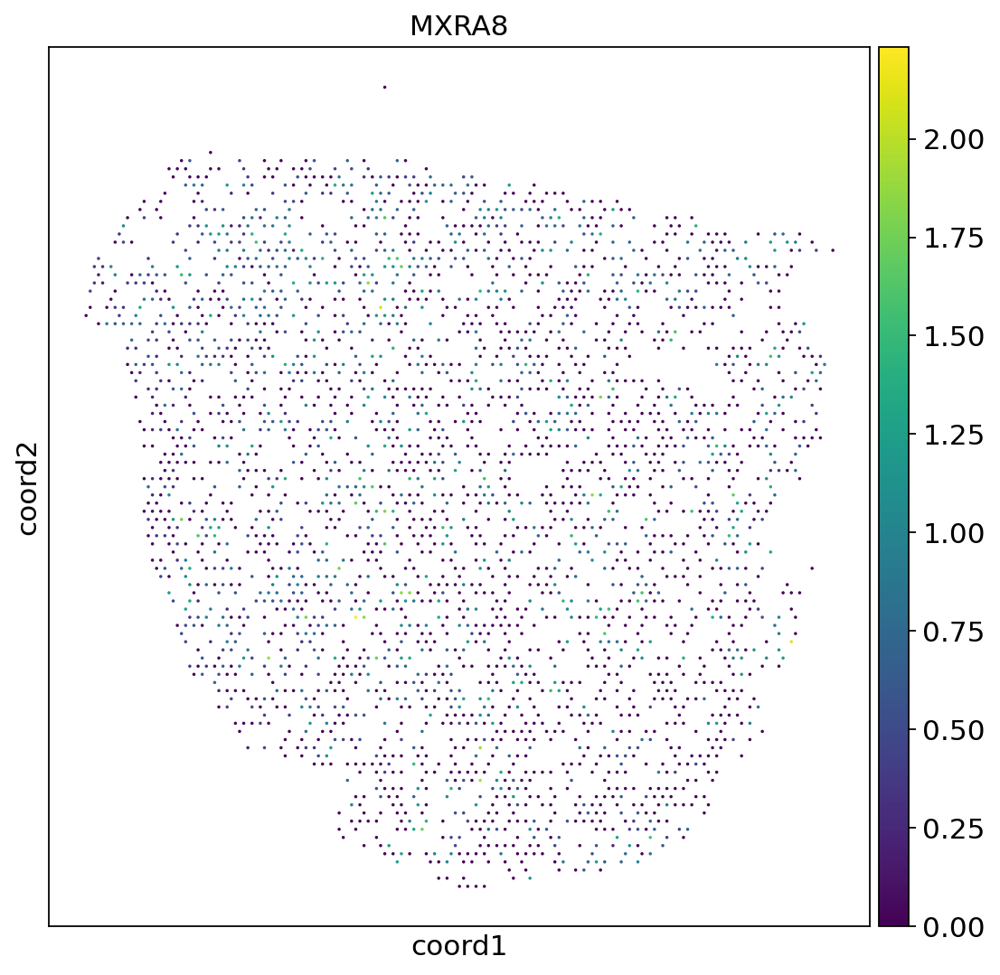

In [25]:
sc.set_figure_params(dpi=80, figsize=(8, 8))
sc.pl.embedding(adata_sample, basis="coord", color=[show_gene[0]], s=10, show=False)

<Axes: title={'center': 'MXRA8'}, xlabel='coord1', ylabel='coord2'>

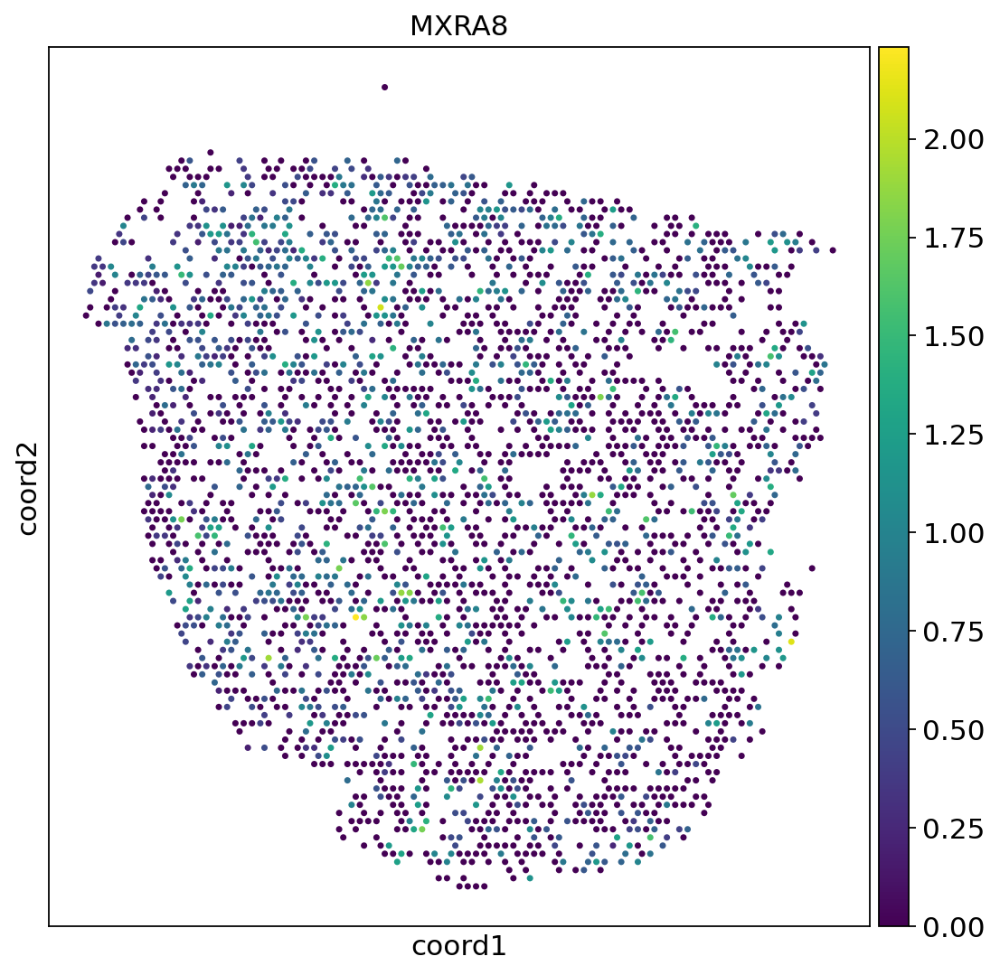

In [26]:
sc.set_figure_params(dpi=80, figsize=(8, 8))
sc.pl.embedding(adata_sample_10000, basis="coord", color=[show_gene[0]], s=40, show=False)

<Axes: title={'center': 'MXRA8'}, xlabel='coord1', ylabel='coord2'>

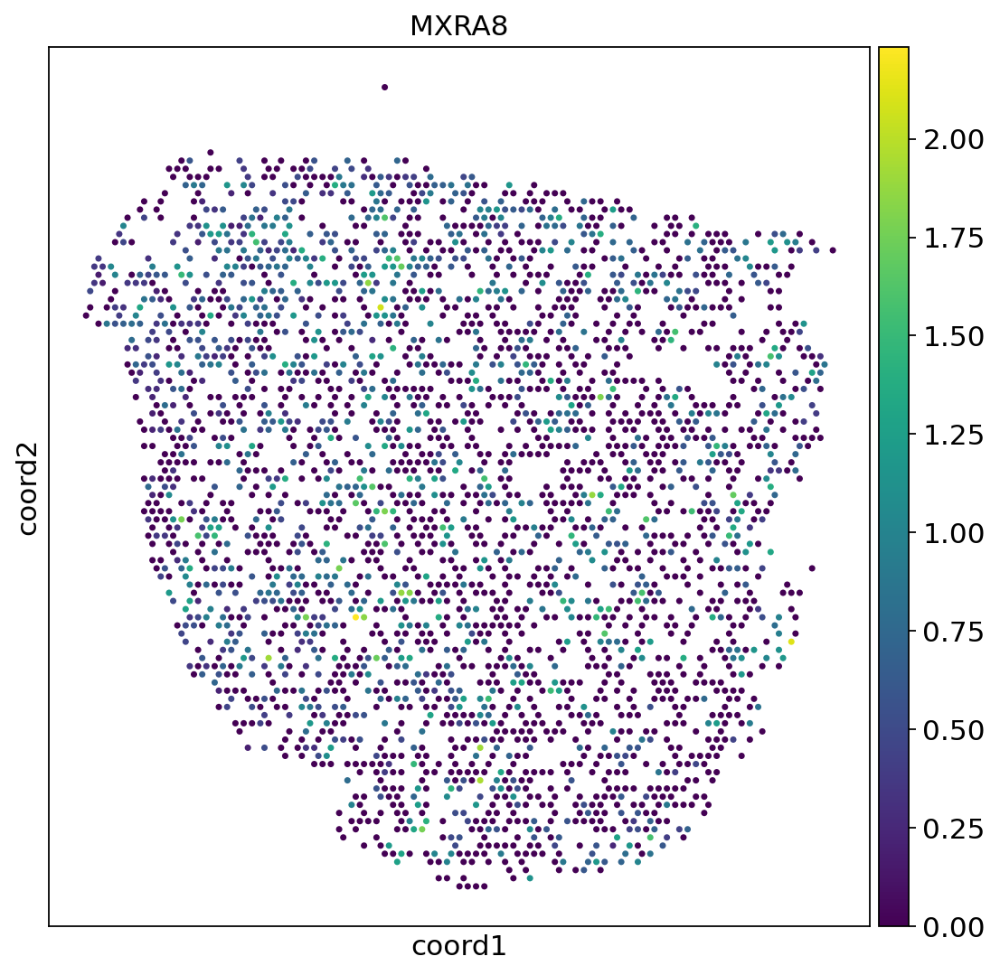

In [27]:
sc.set_figure_params(dpi=80, figsize=(8, 8))
sc.pl.embedding(adata_sample_stored, basis="coord", color=[show_gene[0]], s=40, show=False)

### Pearson Correlation

In [28]:
pr_stage=np.zeros(shape=(adata_stage.shape[1]))
pr_stage_10000 = np.zeros(shape=(adata_stage_10000.shape[1]))
used_gene=adata_stage.var.index

In [29]:
for it in tqdm(range(adata_stage.shape[1])):
    pr_stage[it] = pearsonr(
        adata_stage[:, used_gene[it]].X.toarray().squeeze(),
        adata[:, used_gene[it]].X.toarray().squeeze()
    )[0]
    pr_stage_10000[it] = pearsonr(
        adata_stage_10000[:, used_gene[it]].X.toarray().squeeze(),
        adata[:, used_gene[it]].X.toarray().squeeze()
    )[0]

100%|██████████| 3000/3000 [05:58<00:00,  8.36it/s]


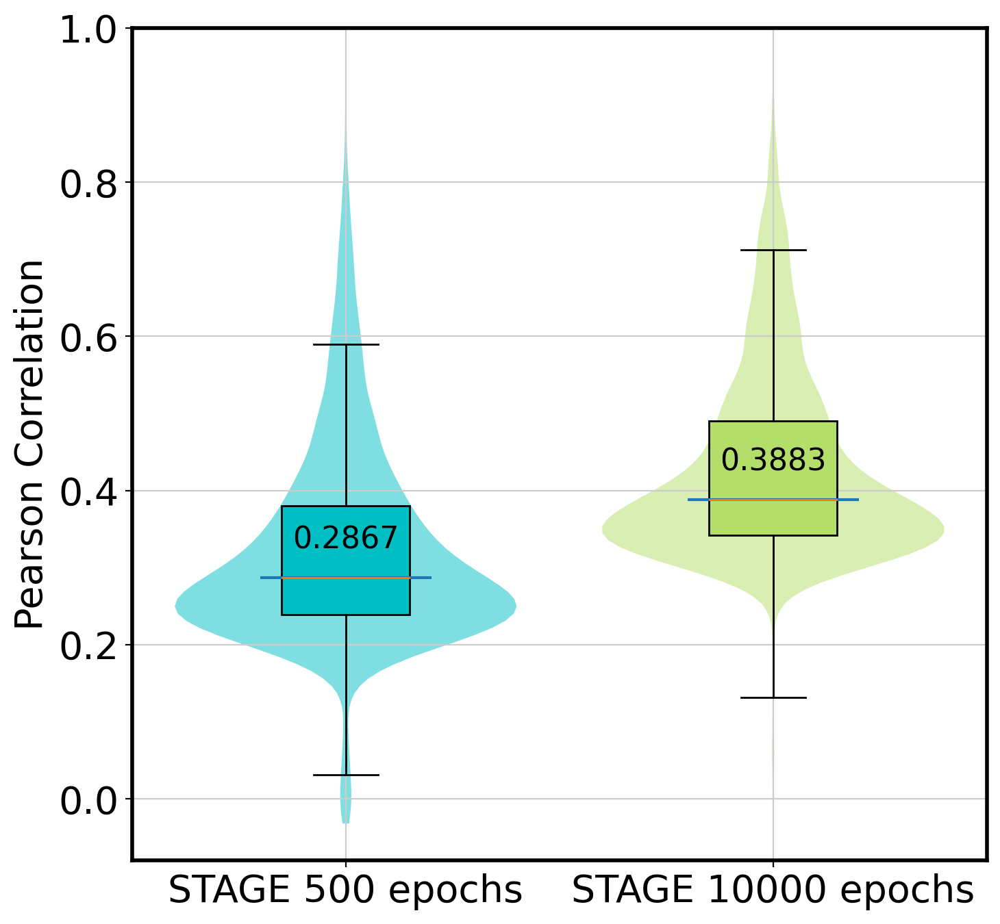

In [30]:
# Set figure parameters
sc.set_figure_params(dpi=100, figsize=(8, 8))

# Only keep common non-NaN values
common_non_nan = np.logical_and(~np.isnan(pr_stage), ~np.isnan(pr_stage_10000))
pr_stage_common = pr_stage[common_non_nan]
pr_stage_10000_common = pr_stage_10000[common_non_nan]

# Prepare data for plotting
distances = [pr_stage_common, pr_stage_10000_common]
colors = ["#00BFC4", "#B3DE69"]
box_color = "grey"

# Create figure
fig, ax = plt.subplots()

# Boxplot
boxplot = ax.boxplot(distances, sym='k+', showfliers=False, widths=0.3, patch_artist=True)
for i, box in enumerate(boxplot['boxes']):
    box.set_facecolor(colors[i])

# Violin plot overlay
violinplot = ax.violinplot(distances, showmedians=True, widths=0.8, showextrema=False)
for partname, part in violinplot.items():
    if partname == 'bodies':
        for pc, color in zip(part, colors):
            pc.set_alpha(0.5)
            pc.set_facecolor(color)

# Set plot labels and style
ax.set_ylim(top=1)
ax.set_xticks([1, 2])
ax.set_xticklabels(['STAGE 500 epochs', 'STAGE 10000 epochs'])
ax.set_ylabel('Pearson Correlation', fontsize=20)
plt.yticks([0, 0.2, 0.4, 0.6, 0.8, 1])

# Make plot borders darker
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(2)

# Adjust tick label sizes
ytick_labels = plt.gca().get_yticklabels()
for label in ytick_labels:
    label.set_fontsize(20)
xtick_labels = plt.gca().get_xticklabels()
for label in xtick_labels:
    label.set_fontsize(20)

# Annotate medians
for median, label in zip(boxplot['medians'], ['STAGE 500 epochs', 'STAGE 10000 epochs']):
    median_value = median.get_ydata()[0]
    x_position = median.get_xdata()[0]
    ax.text(x_position + 0.15, median_value + 0.03, f'{median_value:.4f}', ha='center', va='bottom', fontsize=16, color='black')

plt.show()

## Generation  Experiment

Note from the STAGE paper: **The generation aims to predict gene expression at arbitrary locations, allowing for irregular spatial distribution of spots.**

### Training

In [31]:
stage_model = STAGE.STAGE(
    adata,
    save_path="./STAGE_RESULT",
    data_type='10x',
    experiment='generation',
    coord_sf=77,
    train_epoch=500,
    seed=1234,
    batch_size=512,
    learning_rate=1e-3,
    w_recon=0.1,
    w_w=0.1,
    w_l1=0.1,
    relu=True,
    device='cuda:0'
)

Epochs: 100%|██████████| 500/500 [09:13<00:00,  1.11s/it, latent_loss: 0.45120, recon_loss: 0.18902, total_loss: 0.04701]


In [32]:
print(f"New spot count: {stage_model.n_obs}, New gene count: {stage_model.n_vars}")

New spot count: 23744, New gene count: 3000


In [33]:
print(f"Original spot count: {adata.n_obs}, Original gene count: {adata.n_vars}")

Original spot count: 5936, Original gene count: 18085


In [34]:
stage_model

AnnData object with n_obs × n_vars = 23744 × 3000
    obsm: 'coord'

### Data Visualization

#### Original Data

[<Axes: title={'center': 'MXRA8'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'CLCNKA'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'SFN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FCN3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'LAPTM5'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FAM151A'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'TACSTD2'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'JUN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'PTGER3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'ST6GALNAC3'}, xlabel='coord1', ylabel='coord2'>]

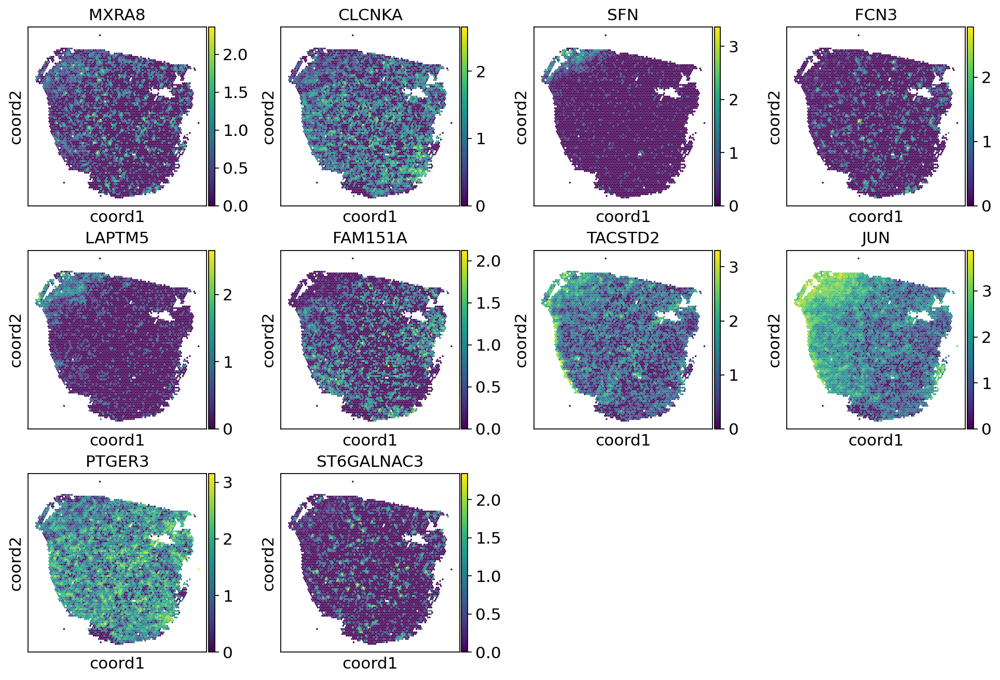

In [35]:
sc.set_figure_params(dpi=80, figsize=(2.8, 3))
sc.pl.embedding(adata, basis="coord", color=show_gene, s=10, show=False)

#### Generated Data (train_epoch=500)

[<Axes: title={'center': 'MXRA8'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'CLCNKA'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'SFN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FCN3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'LAPTM5'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FAM151A'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'TACSTD2'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'JUN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'PTGER3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'ST6GALNAC3'}, xlabel='coord1', ylabel='coord2'>]

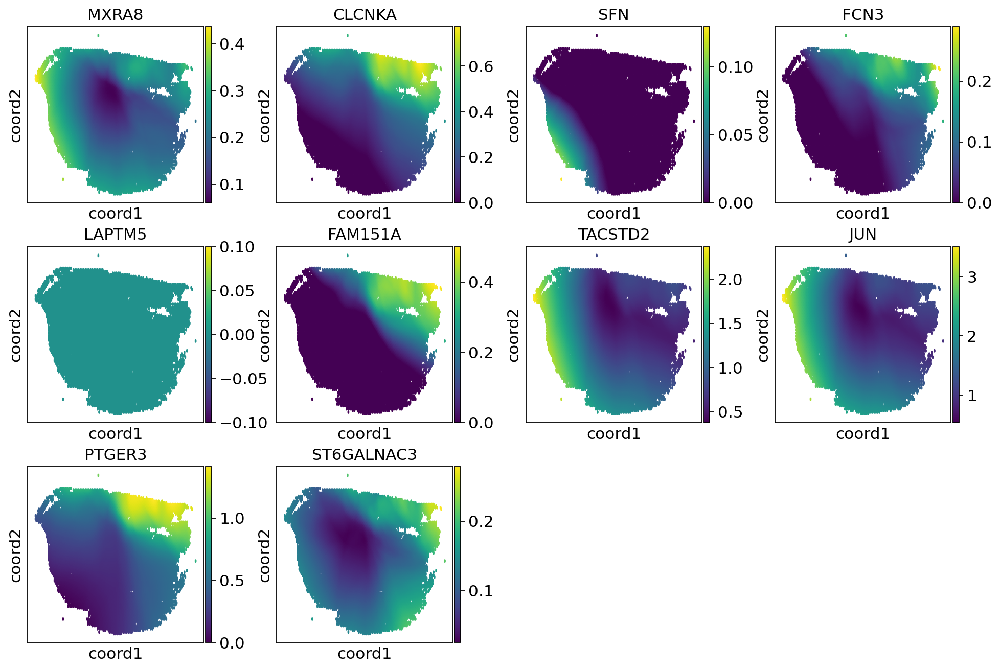

In [36]:
sc.set_figure_params(dpi=80, figsize=(2.8, 3))
sc.pl.embedding(stage_model, basis="coord", color=show_gene, s=10, show=False)

#### Generated Data (train_epoch=10,000)

In [37]:
stage_model_10000 = joblib.load("stage_model.joblib")

[<Axes: title={'center': 'MXRA8'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'CLCNKA'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'SFN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FCN3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'LAPTM5'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'FAM151A'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'TACSTD2'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'JUN'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'PTGER3'}, xlabel='coord1', ylabel='coord2'>,
 <Axes: title={'center': 'ST6GALNAC3'}, xlabel='coord1', ylabel='coord2'>]

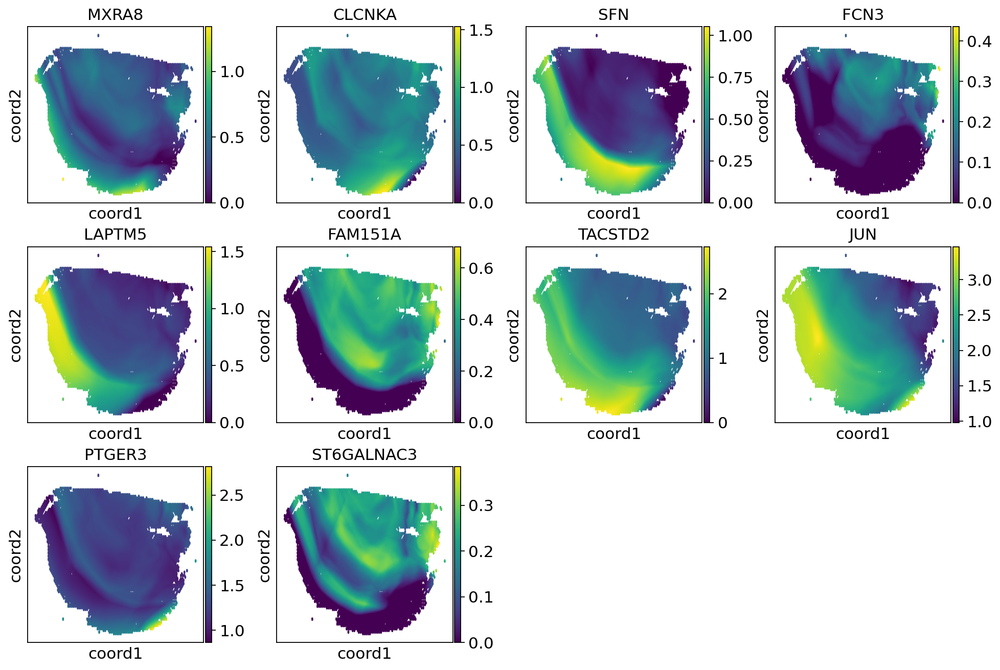

In [38]:
sc.set_figure_params(dpi=80, figsize=(2.8, 3))
sc.pl.embedding(stage_model_10000, basis="coord", color=show_gene, s=10, show=False)